In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import r2_score
from sklearn.gaussian_process.kernels import RBF, WhiteKernel,Matern
from bayes_opt import BayesianOptimization
from bayes_opt import UtilityFunction
import os

In [2]:
def Normalized_Branin(x, y):
    PI = 3.14159265359
    a = 1
    b = 5.1 / (4 * pow(PI, 2))
    c = 5 / PI
    r = 6
    s = 10
    t = 1 / (8 * PI)

    x1 = x * 15 - 5
    x2 = y * 15

    f = a * (x2 - b * x1 ** 2 + c * x1 - r) ** 2 + s * (1 - t) * np.cos(x1) + s
    return -f

In [3]:
# visualization function
def plot_oneiter(opt,aqf_func,save_fig = False,index = 0,prefix = 'BO',**kwarg):
    cmap = 'YlGnBu_r'
    ## generate full map points
    feature_x = np.arange(0,1.02,0.002)
    feature_y = np.arange(0,1.02,0.002)
    [Xm,Ym] = np.meshgrid(feature_x,feature_y)
    Pm = np.array([Xm,Ym])
    Zm_real = Normalized_Branin(Pm[0],Pm[1]) ## true map data
    
    ## result from gpr
    Zm_pred_mean=np.zeros(Zm_real.shape)
    Zm_pred_sigma=np.zeros(Zm_real.shape)
    aqf_val=np.zeros(Zm_real.shape)
    
    for i in range(0,Zm_real.shape[0]):
        ## create a array for parallel estimation
        one_array = np.array([np.array([feature_x[i],feature_y[j]]).reshape(1,-1)[0] for j in range(0,Zm_real.shape[0])])
        one_vec_mean,one_vec_sigma = opt._gp.predict(one_array,return_std = True)
        Zm_pred_mean[:,i] = one_vec_mean
        Zm_pred_sigma[:,i] = one_vec_sigma
        one_aq = aqf_func.utility(one_array,opt._gp,np.max(opt.space.target))
        aqf_val[:,i] = one_aq
    
    next_point_to_probe = opt.suggest(aqf_func)
    next_point = np.array([next_point_to_probe['x'],next_point_to_probe['y']])
#     print('suggested point ac value',aqf_func.utility(next_point.reshape(1,-1),opt._gp,np.max(opt.space.target)))
    # clip for visulization purpose
    next_point = np.clip(next_point, 0.005,0.995)
    
    # get the current best point
    fval_collect = np.array([opt.res[k]['target'] for k in range(len(opt.res))])
    max_ind = np.argmax(fval_collect)
    best_point = np.array([opt.res[max_ind]['params']['x'],opt.res[max_ind]['params']['y']])
    best_point = np.clip(best_point, 0.005,0.995)
    
    ## plot results
    fig,((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2)
    plt.subplots_adjust(wspace=0.13,hspace = 0.13)
    fig.set_size_inches(24,20)
    cf1 = ax1.contourf(Xm,Ym,Zm_real,cmap = cmap,levels=np.linspace(-300, 0, 50))
    ax1.contour(Xm,Ym,Zm_real,levels=np.linspace(-300, 0, 50),linewidths = 1,linestyles='solid',colors = 'k')
    cbar1 = fig.colorbar(cf1,ax = ax1)
    cbar1.ax.tick_params(labelsize = 20)
#     ax1.plot(512,404.2319,'*w',ms = 25)
    ax1.scatter(opt.space.params[:,0],opt.space.params[:,1],color = 'm')
    ax1.scatter(best_point[0],best_point[1],color = 'm',marker = '*',s=300)
    ax1.plot([0,1],[next_point[1],next_point[1]],'r-',linewidth = 2)
    ax1.plot([next_point[0],next_point[0]],[0,1],'r-',linewidth = 2)
    ax1.axis([0,1,0,1])
    ax1.set_title('True map',fontsize = 25)
    ax1.tick_params(labelsize = 20)
    
    cf2 = ax2.contourf(Xm,Ym,Zm_pred_mean,cmap = cmap,levels=np.linspace(-300, 0, 50))
    ax2.contour(Xm,Ym,Zm_pred_mean,levels=np.linspace(-300, 0, 50),linewidths = 1,linestyles='solid',colors = 'k')
    cbar2 = fig.colorbar(cf2,ax = ax2)
    cbar2.ax.tick_params(labelsize = 20)
#     cbar2.ax.set_yticklabels([-300+20*i for i in range(15)])
    ax2.scatter(opt.space.params[:,0],opt.space.params[:,1],color = 'm')
    ax2.scatter(opt.space.params[0,0],opt.space.params[0,1],color = 'm',label = 'current samples')
    ax2.scatter(best_point[0],best_point[1],color = 'm',marker = '*',s=300,label = 'current optimum')
    ax2.plot([0,1],[next_point[1],next_point[1]],'r-',linewidth = 2,label = 'next sample')
    ax2.plot([next_point[0],next_point[0]],[0,1],'r-',linewidth = 2)
    ax2.axis([0,1,0,1])
    ax2.set_title('Mean of GPR',fontsize = 25)
    ax2.tick_params(labelsize = 20)
    ax2.legend(loc='upper right',fontsize = 20)
    
    cf3 = ax3.contourf(Xm,Ym,Zm_pred_sigma,cmap = cmap,levels = 20)
    ax3.contour(Xm,Ym,Zm_pred_sigma,levels = 20,linewidths = 1,linestyles='solid',colors = 'k')
    cbar3 = fig.colorbar(cf3,ax = ax3)
    cbar3.ax.tick_params(labelsize = 20)
    ax3.scatter(opt.space.params[:,0],opt.space.params[:,1],color = 'm')
    ax3.scatter(best_point[0],best_point[1],color = 'm',marker = '*',s=300)
    ax3.plot([0,1],[next_point[1],next_point[1]],'r-',linewidth = 2)
    ax3.plot([next_point[0],next_point[0]],[0,1],'r-',linewidth = 2)
    ax3.axis([0,1,0,1])
    ax3.set_title('Variance of GPR',fontsize = 25)
    ax3.tick_params(labelsize = 20)

    
    cf4 = ax4.contourf(Xm,Ym,aqf_val,cmap = cmap,levels = 20)
    ax4.contour(Xm,Ym,aqf_val,levels = 20,linewidths = 1,linestyles='solid',colors = 'k')
    cbar4 = fig.colorbar(cf4,ax = ax4)
    cbar4.ax.tick_params(labelsize = 20)
    ax4.scatter(opt.space.params[:,0],opt.space.params[:,1],color = 'm')
    ax4.scatter(best_point[0],best_point[1],color = 'm',marker = '*',s=300)
    ## plot next query opoint
    ax4.plot([0,1],[next_point[1],next_point[1]],'r-',linewidth = 2)
    ax4.plot([next_point[0],next_point[0]],[0,1],'r-',linewidth = 2)
    ax4.axis([0,1,0,1])
    ax4.set_title('Acquisition function',fontsize = 25)
    ax4.tick_params(labelsize = 20)
    
    if save_fig == True:
        fig.savefig(prefix+'Iter'+str(index),bbox_inches = 'tight')



|   iter    |  target   |     x     |     y     |
-------------------------------------------------
|  2        | -62.48    |  0.4632   |  0.7249   |
|  3        | -22.37    |  0.4202   |  0.4854   |
|   iter    |  target   |     x     |     y     |
-------------------------------------------------
|  2        | -62.48    |  0.4632   |  0.7249   |
|  3        | -22.37    |  0.4202   |  0.4854   |
|   iter    |  target   |     x     |     y     |
-------------------------------------------------
|  2        | -62.48    |  0.4632   |  0.7249   |
|  3        | -22.37    |  0.4202   |  0.4854   |
|  7        | -21.84    |  0.423    |  0.4804   |
|   iter    |  target   |     x     |     y     |
-------------------------------------------------
|  2        | -62.48    |  0.4632   |  0.7249   |
|  3        | -22.37    |  0.4202   |  0.4854   |
|  7        | -21.84    |  0.423    |  0.4804   |
|  8        | -19.9     |  0.4311   |  0.4618   |
|   iter    |  target   |     x     |     y     |


|  16       | -3.988    |  0.5405   |  0.2797   |
|   iter    |  target   |     x     |     y     |
-------------------------------------------------
|  2        | -62.48    |  0.4632   |  0.7249   |
|  3        | -22.37    |  0.4202   |  0.4854   |
|  7        | -21.84    |  0.423    |  0.4804   |
|  8        | -19.9     |  0.4311   |  0.4618   |
|  9        | -17.05    |  0.4445   |  0.4354   |
|  10       | -14.14    |  0.4608   |  0.4094   |
|  11       | -10.83    |  0.4844   |  0.3799   |
|  12       | -7.993    |  0.5164   |  0.3481   |
|  13       | -7.295    |  0.5475   |  0.3228   |
|  15       | -6.151    |  0.5444   |  0.3103   |
|  16       | -3.988    |  0.5405   |  0.2797   |
|  17       | -2.518    |  0.5352   |  0.2533   |
|   iter    |  target   |     x     |     y     |
-------------------------------------------------
|  2        | -62.48    |  0.4632   |  0.7249   |
|  3        | -22.37    |  0.4202   |  0.4854   |
|  7        | -21.84    |  0.423    |  0.4804   |


|  20       | -0.5361   |  0.5437   |  0.1757   |
|  21       | -0.4926   |  0.5501   |  0.159    |
|  22       | -0.4728   |  0.5504   |  0.1529   |
|   iter    |  target   |     x     |     y     |
-------------------------------------------------
|  2        | -62.48    |  0.4632   |  0.7249   |
|  3        | -22.37    |  0.4202   |  0.4854   |
|  7        | -21.84    |  0.423    |  0.4804   |
|  8        | -19.9     |  0.4311   |  0.4618   |
|  9        | -17.05    |  0.4445   |  0.4354   |
|  10       | -14.14    |  0.4608   |  0.4094   |
|  11       | -10.83    |  0.4844   |  0.3799   |
|  12       | -7.993    |  0.5164   |  0.3481   |
|  13       | -7.295    |  0.5475   |  0.3228   |
|  15       | -6.151    |  0.5444   |  0.3103   |
|  16       | -3.988    |  0.5405   |  0.2797   |
|  17       | -2.518    |  0.5352   |  0.2533   |
|  18       | -1.535    |  0.5356   |  0.2267   |
|  19       | -0.9046   |  0.5351   |  0.2021   |
|  20       | -0.5361   |  0.5437   |  0.1757   |


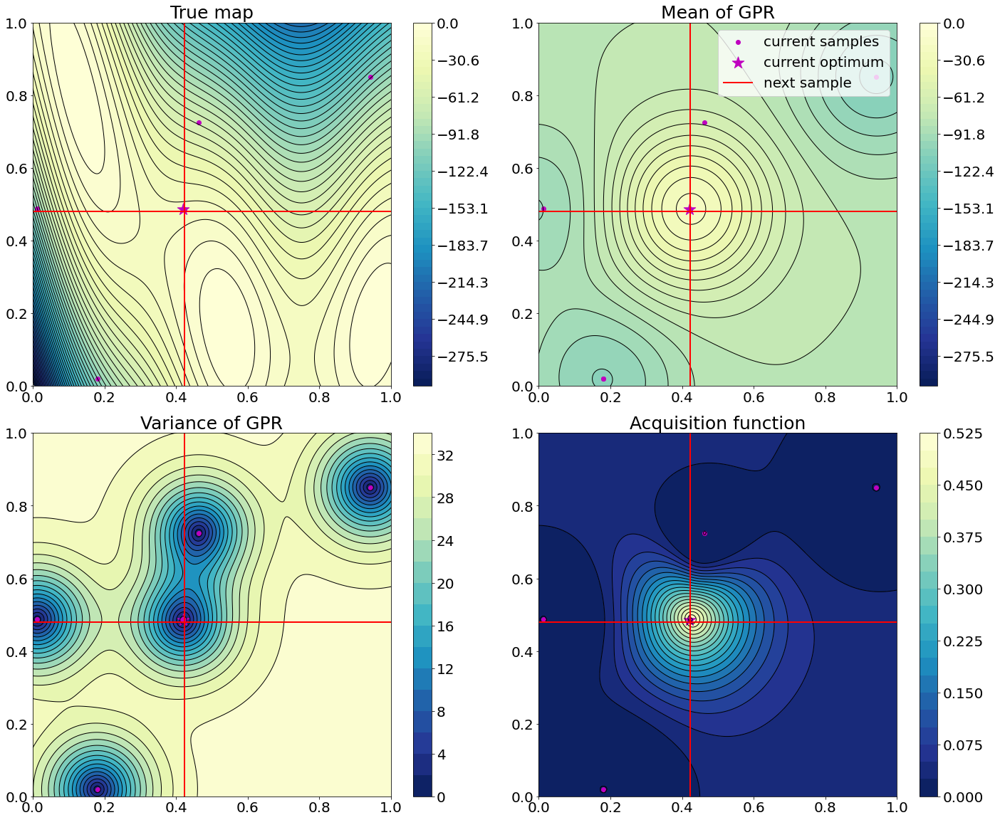

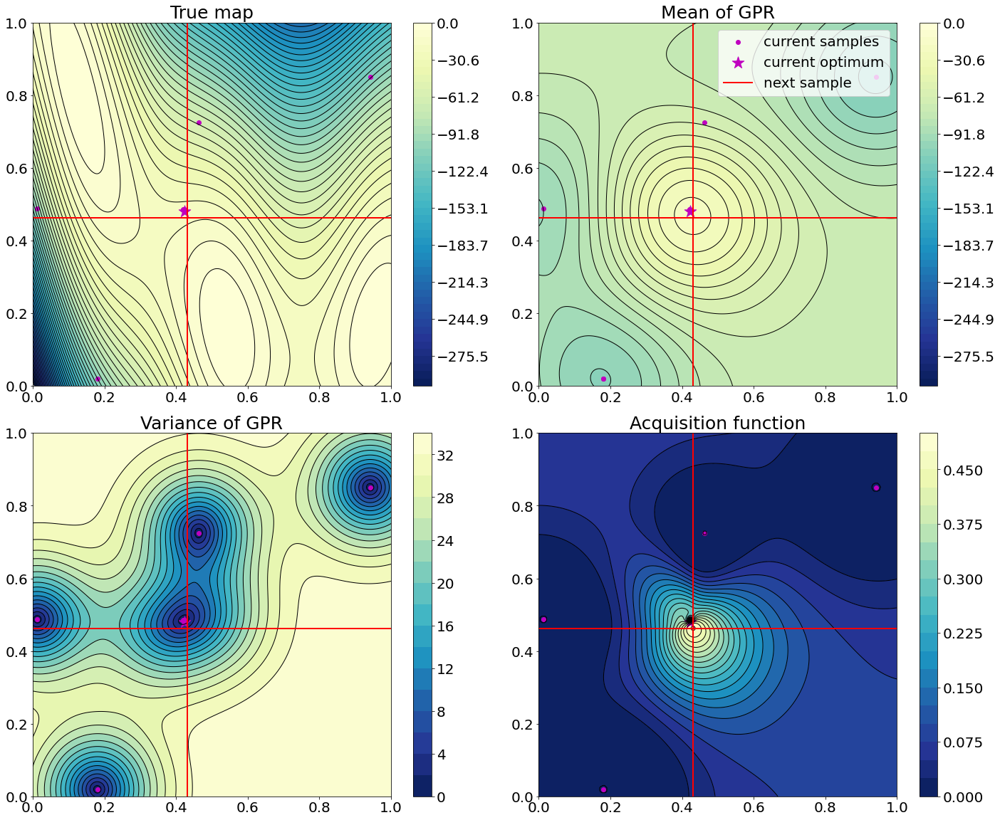

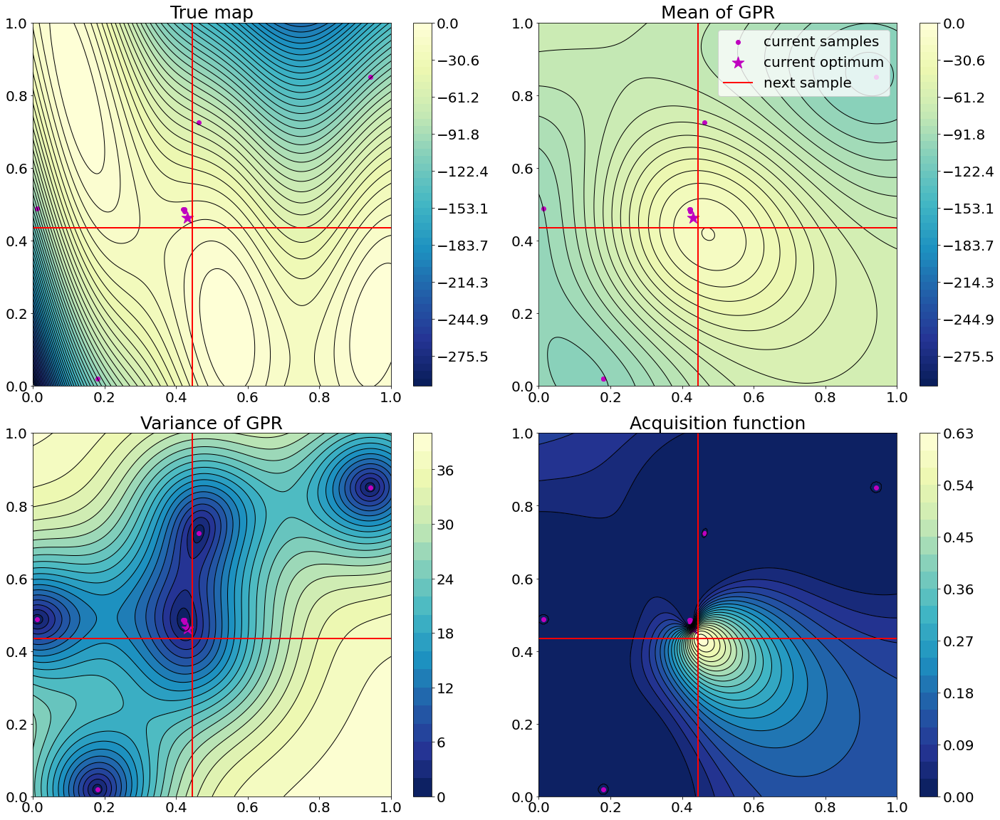

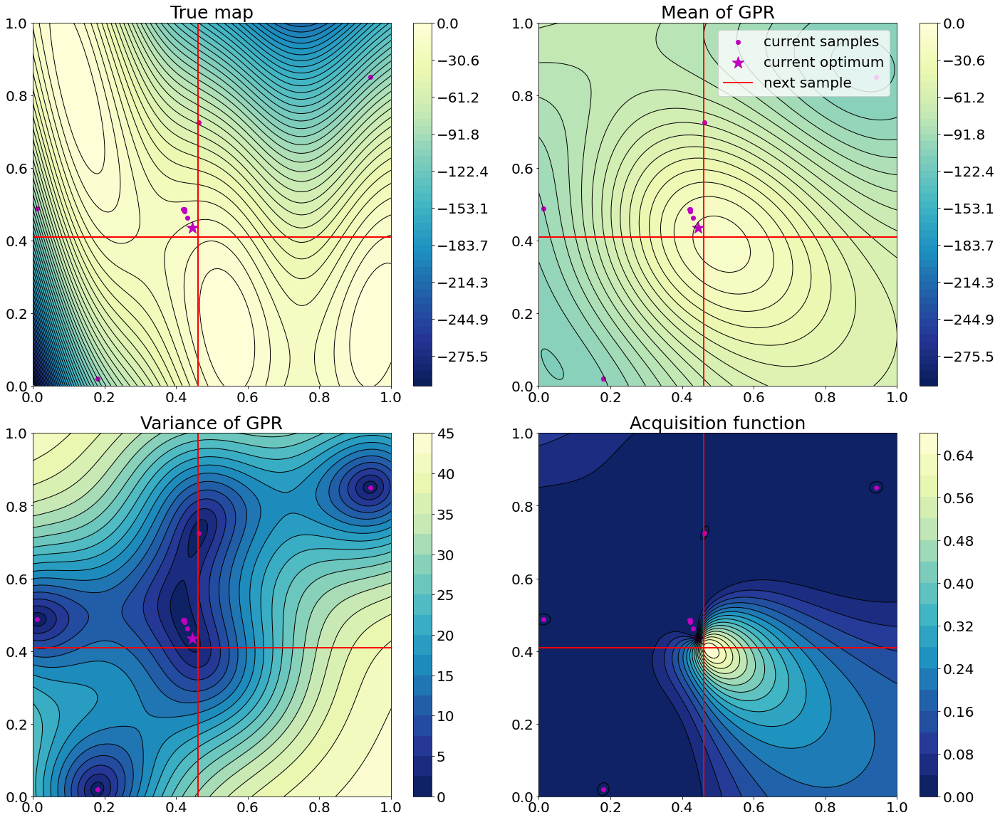

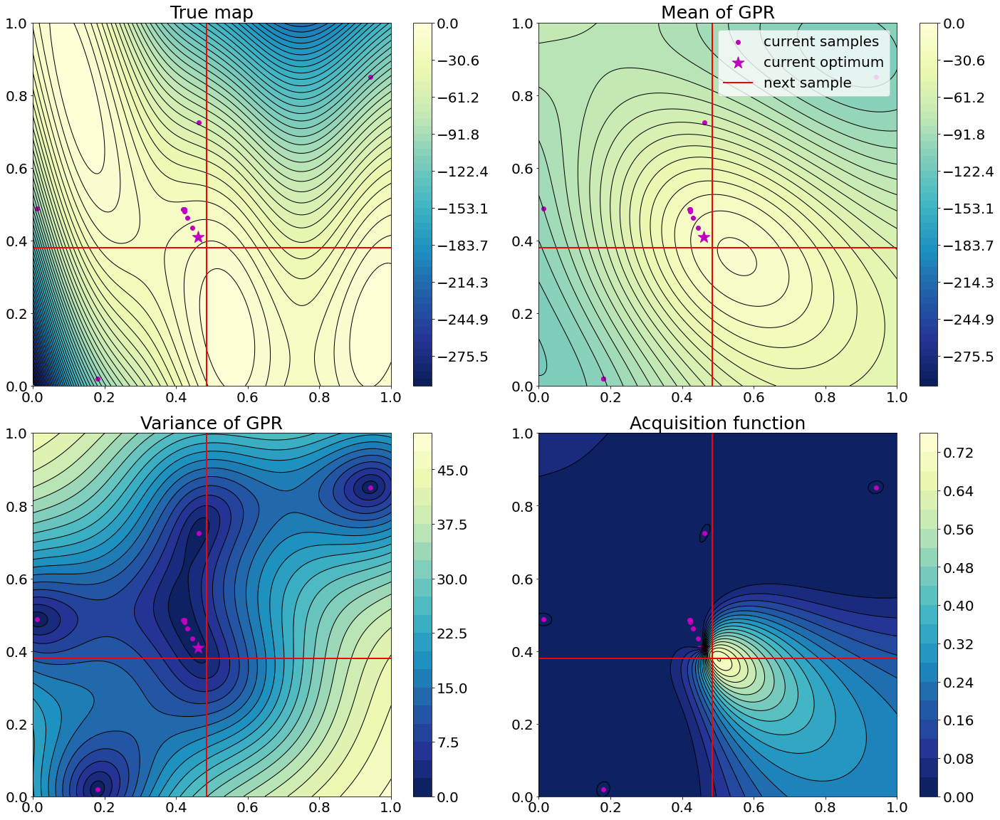

...

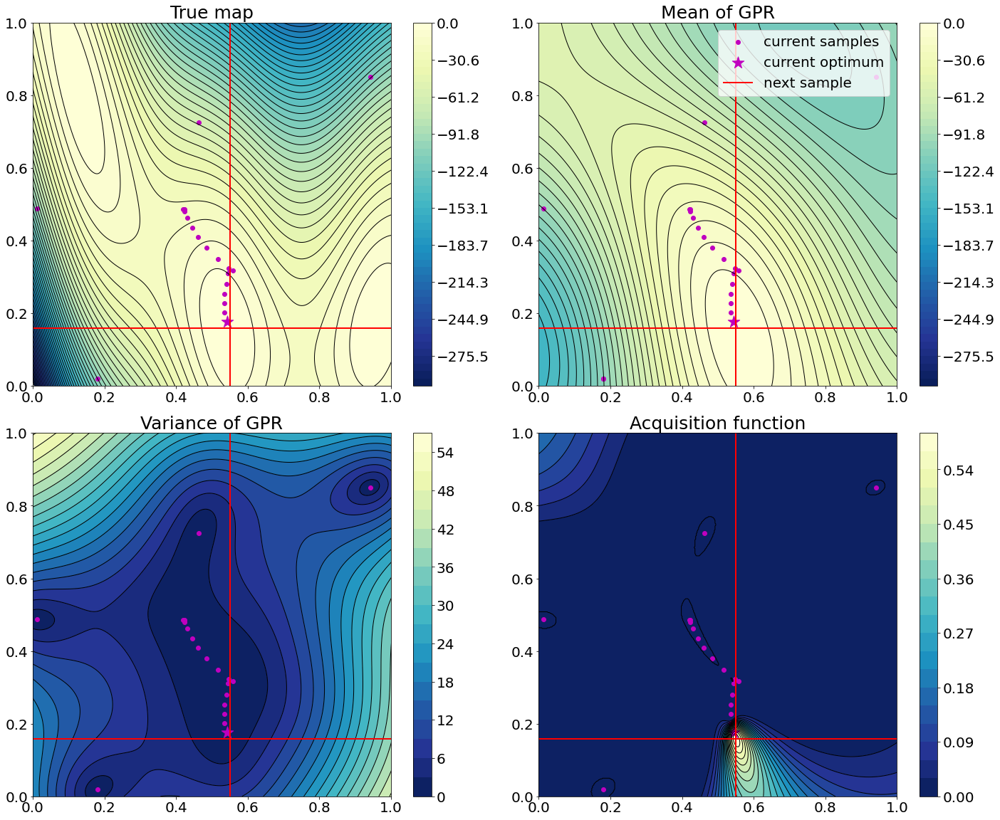

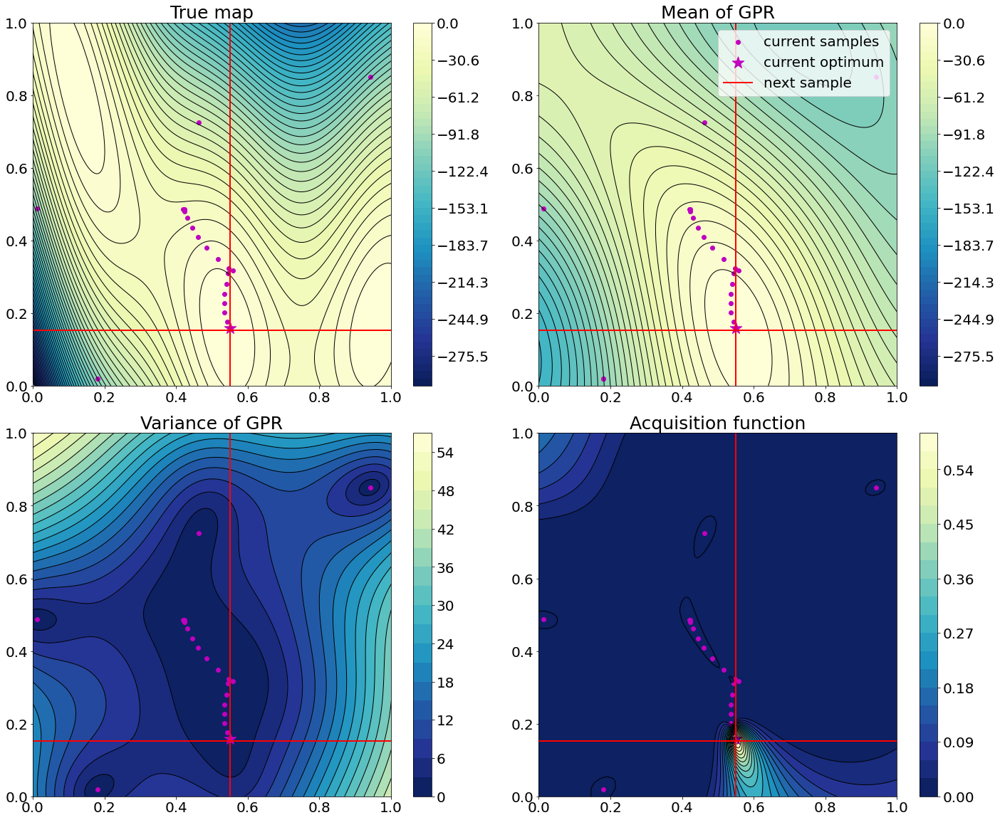

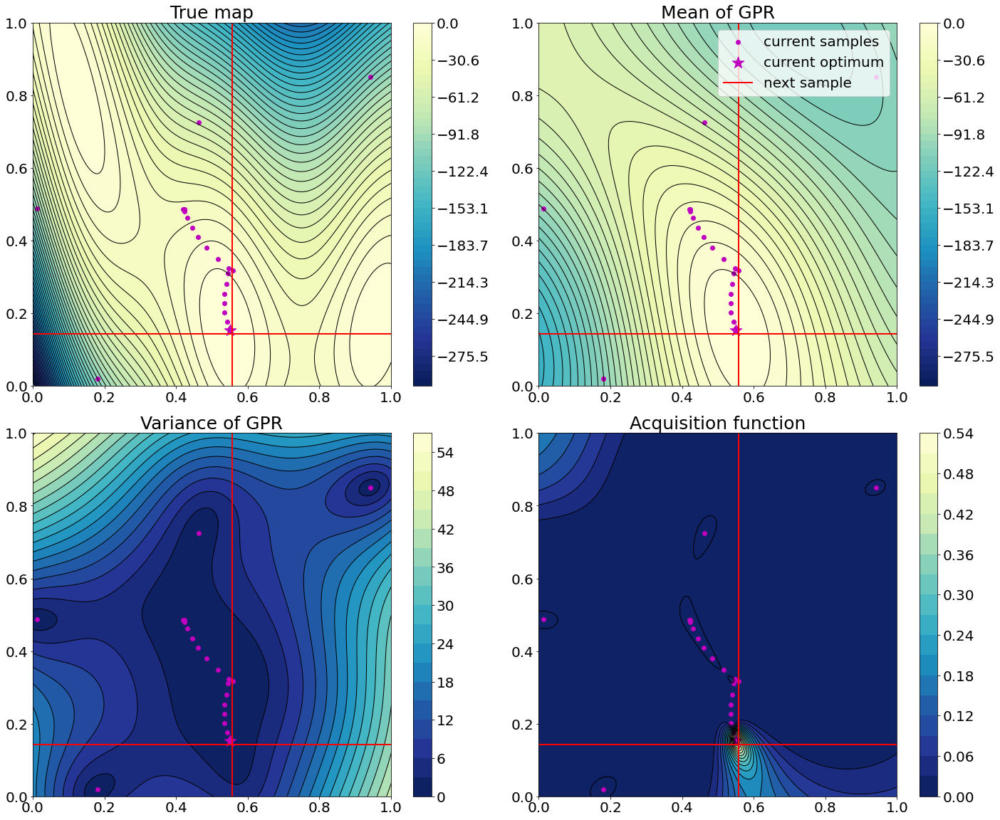

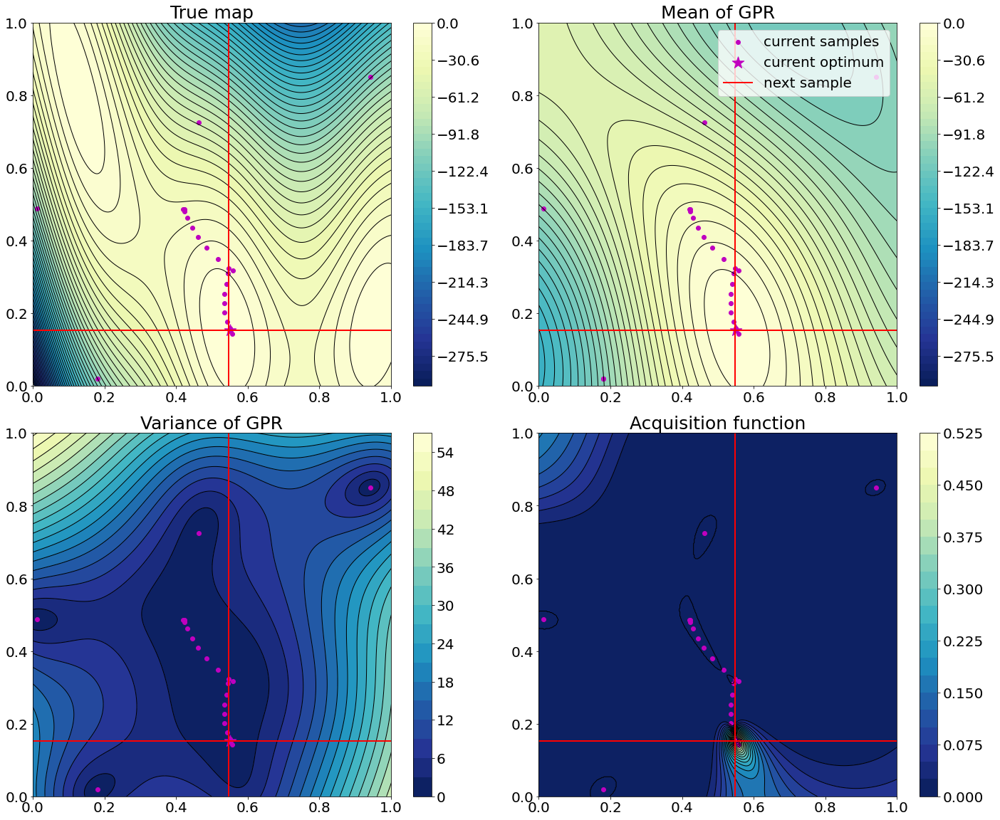

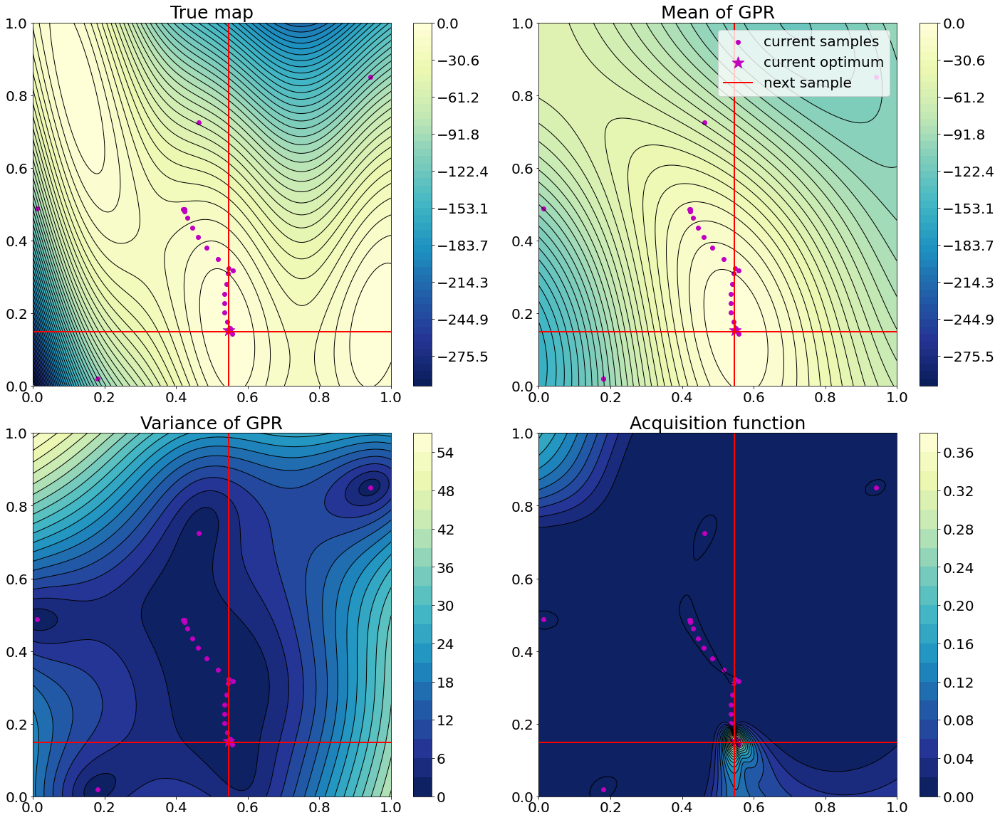

In [4]:
pbounds = {'x': (0,1),'y': (0,1)}
xi = 0
for it_num in range(20):
    bo = BayesianOptimization(
                f=Normalized_Branin,
                pbounds=pbounds,
                verbose=1, # verbose = 1 prints only when a maximum is observed, verbose = 0 is silent
                random_state=11,
            )

    kernel = 1.0 * RBF(length_scale= 0.2, length_scale_bounds=(1e-2, 1))
#     kernel = 1.0 * Matern(length_scale= 0.2, length_scale_bounds=(1e-2, 0.5),nu=1.5) 
    bo.set_gp_params(kernel = kernel,alpha = 1e-4,n_restarts_optimizer = 0)

    kappa = 1e-2
    ## initial 
    bo.maximize(
            init_points=5,
            n_iter=it_num,
            acq = 'poi',
            xi=xi,
            kappa = kappa
    )
#     print(bo.res[-1])
    aqf = UtilityFunction(kind= 'poi', kappa = kappa, xi = xi)
#     plot_oneiter(bo,aqf,save_fig = True, index = it_num, prefix = 'BO_ei_kappa1e-1')
    if it_num>=1:
        plot_oneiter(bo,aqf,save_fig = True, index = it_num, prefix = 'BO_poi_kappa1e-2')


## 1-D example

In [5]:
import matplotlib.pyplot as plt
import numpy as np


def plot_gpr_samples(gpr_model, n_samples, ax):
    """Plot samples drawn from the Gaussian process model.

    If the Gaussian process model is not trained then the drawn samples are
    drawn from the prior distribution. Otherwise, the samples are drawn from
    the posterior distribution. Be aware that a sample here corresponds to a
    function.

    Parameters
    ----------
    gpr_model : `GaussianProcessRegressor`
        A :class:`~sklearn.gaussian_process.GaussianProcessRegressor` model.
    n_samples : int
        The number of samples to draw from the Gaussian process distribution.
    ax : matplotlib axis
        The matplotlib axis where to plot the samples.
    """
    x = np.linspace(0, 5, 100)
    X = x.reshape(-1, 1)

    y_mean, y_std = gpr_model.predict(X, return_std=True)
    y_samples = gpr_model.sample_y(X, n_samples)

    for idx, single_prior in enumerate(y_samples.T):
        ax.plot(
            x,
            single_prior,
            linestyle="--",
            alpha=0.7,
            label=f"Sampled function #{idx + 1}",
        )
    ax.plot(x, y_mean, color="black", label="Mean")
    ax.fill_between(
        x,
        y_mean - 3*y_std,
        y_mean + 3*y_std,
        alpha=0.1,
        color="black",
        label=r"$\pm$ 3 std. dev.",
    )
    ax.set_xlabel("x")
    ax.set_ylabel("f(x)")
    ax.set_ylim([-3, 3])

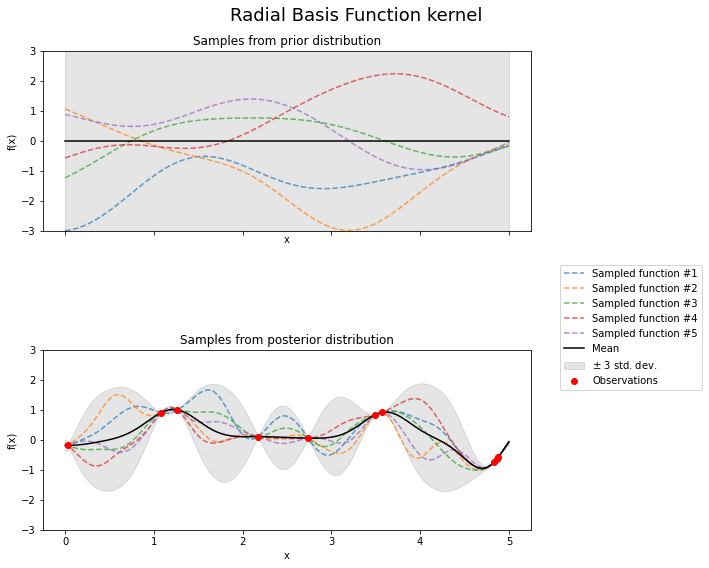

In [6]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF

rng = np.random.RandomState(4)
X_train = rng.uniform(0, 5, 10).reshape(-1, 1)
y_train = np.sin((X_train[:, 0] - 2.5) ** 2)
n_samples = 5
kernel = 1.0 * RBF(length_scale=1.0, length_scale_bounds=(1e-1, 10.0))
gpr = GaussianProcessRegressor(kernel=kernel, random_state=0)

fig, axs = plt.subplots(nrows=2, sharex=True, sharey=True, figsize=(10, 8))

# plot prior
plot_gpr_samples(gpr, n_samples=n_samples, ax=axs[0])
axs[0].set_title("Samples from prior distribution")

# plot posterior
gpr.fit(X_train, y_train)
plot_gpr_samples(gpr, n_samples=n_samples, ax=axs[1])
axs[1].scatter(X_train[:, 0], y_train, color="red", zorder=10, label="Observations")
axs[1].legend(bbox_to_anchor=(1.05, 1.5), loc="upper left")
axs[1].set_title("Samples from posterior distribution")

fig.suptitle("Radial Basis Function kernel", fontsize=18)
plt.tight_layout()
fig.savefig('concept.png',dpi = 300)